In [25]:
import cv2 as cv
import cv2
import dlib
import imageio
import numpy as np
import os
import urllib.request
import bz2
from google.colab.patches import cv2_imshow
from cv2.gapi.wip import draw

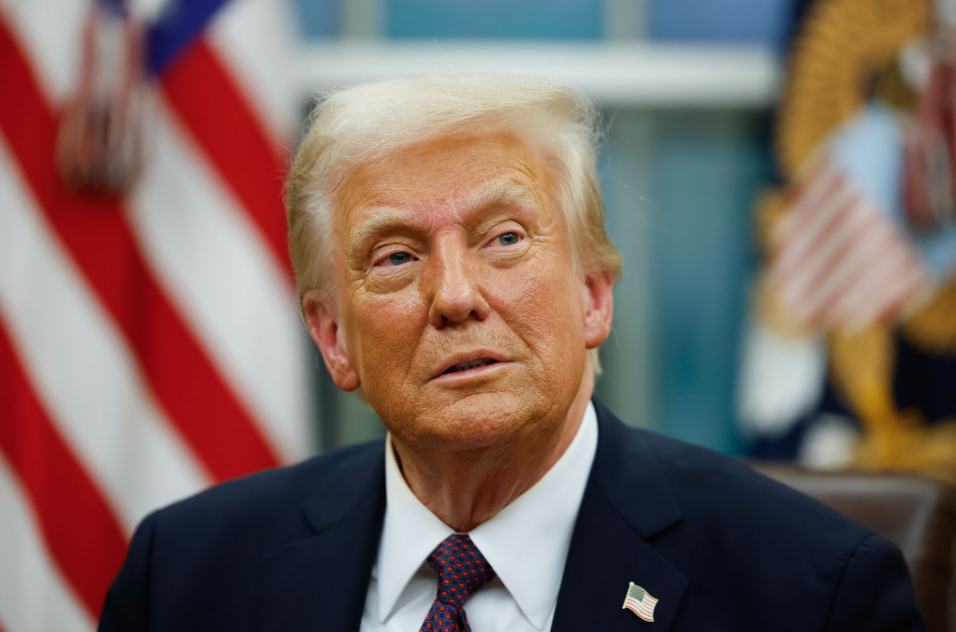

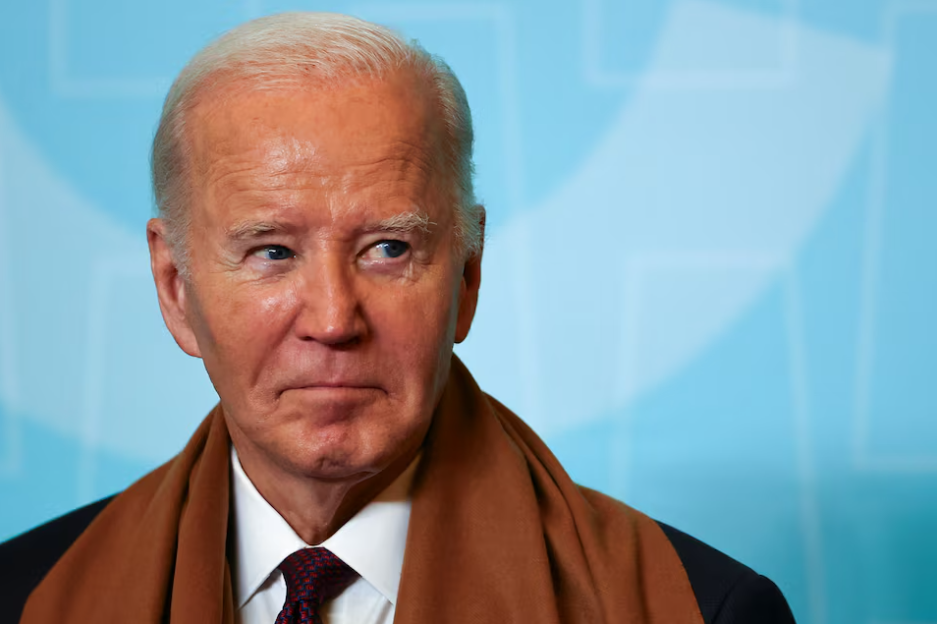

In [26]:
img1 = cv.imread("Donald_Trump.png")
cv2_imshow(img1)
img1 = cv.cvtColor(img1, cv.COLOR_BGR2RGB)

img2 = cv.imread("Joe_Biden.png")
cv2_imshow(img2)
img2 = cv.cvtColor(img2, cv.COLOR_BGR2RGB)

In [27]:
# Define separate lists for landmark points of each image
points1 = []
points2 = []

In [28]:
# Define the file names
file_name = "shape_predictor_68_face_landmarks.dat"
compressed_file = file_name + ".bz2"
url = f"http://dlib.net/files/{compressed_file}"

# Check if file already exists so we don't download it twice in one session
if not os.path.exists(file_name):
    print(f"Downloading {file_name}...")
    # Download the compressed file
    urllib.request.urlretrieve(url, compressed_file)

    # Decompress it
    print("Decompressing...")
    with bz2.BZ2File(compressed_file, 'rb') as fr, open(file_name, 'wb') as fw:
        fw.write(fr.read())

    print(f"Done! {file_name} is ready to use.")
else:
    print(f"{file_name} is already here.")

shape_predictor_68_face_landmarks.dat is already here.


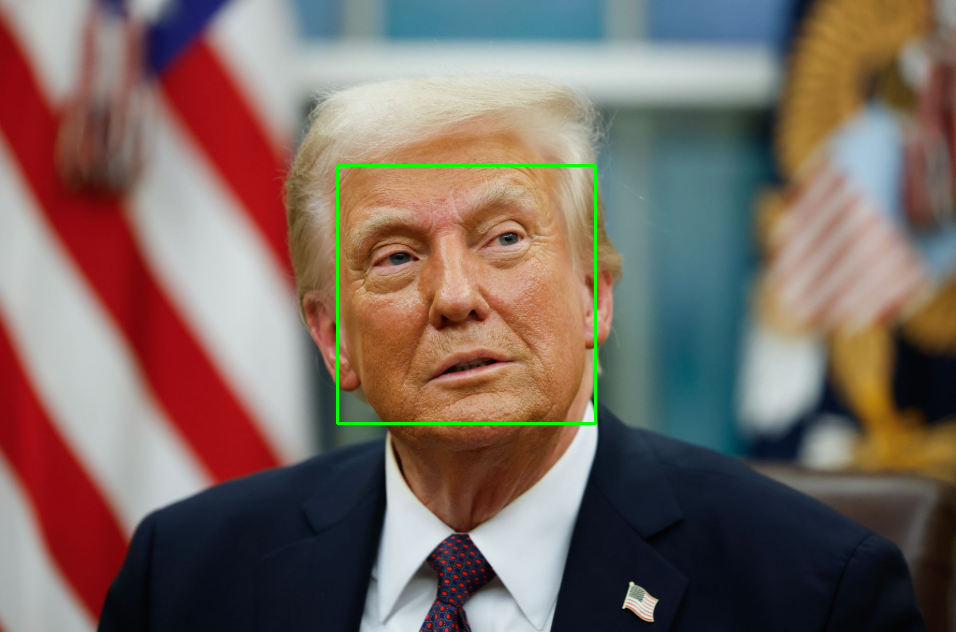

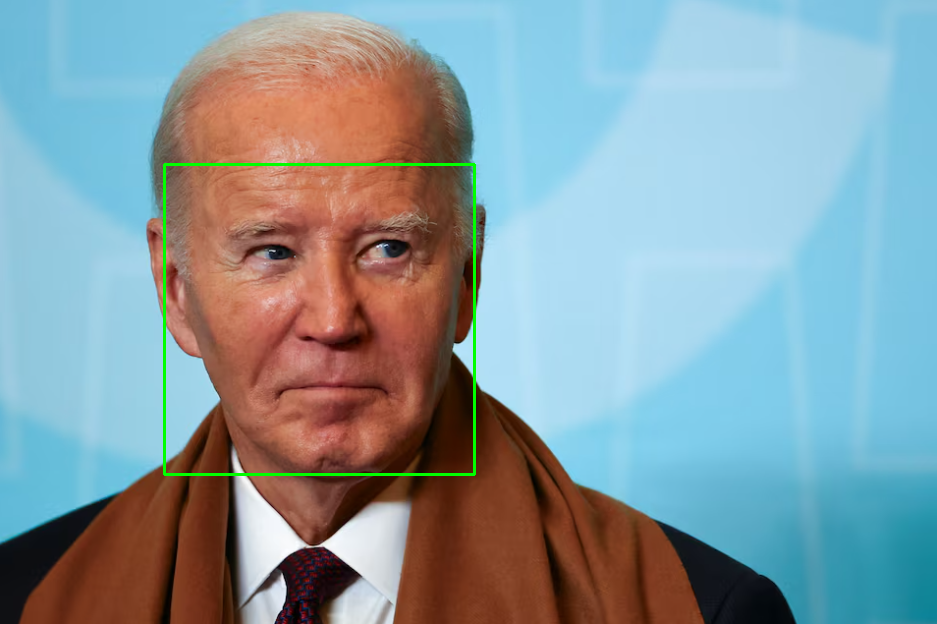

In [29]:
def landmark_generator(point_list, img):
    # Define the image copy to not affect the original image
    img_copy = img.copy()

    # Load the Detector(Face Finder)
    detector = dlib.get_frontal_face_detector()

    # Load the predictor
    predictor = dlib.shape_predictor("shape_predictor_68_face_landmarks.dat")

    # Convert image to grayscale (Detectors work on gray images)
    gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

    # Find faces
    faces = detector(gray)

    # Create a copy so we don't draw on the original image yet
    img_faces = img.copy()

    # Read in the points from a text file
    for i, face in enumerate(faces):
      # Visualize detected face
      x1 = face.left()
      y1 = face.top()
      x2 = face.right()
      y2 = face.bottom()

      # Draw the rectangle (Green color, thickness 2)
      cv2.rectangle(img_faces, (x1, y1), (x2, y2), (0, 255, 0), 2)

      # Get the landmarks
      landmarks = predictor(gray, face)

      # Loop through the 68(because of the .dat model we use) points and add them to your list
      for n in range(0, 68):
        x = landmarks.part(n).x
        y = landmarks.part(n).y
        point_list.append((x, y))

    # Append corner points of the image
    point_list.append((0, 0))
    point_list.append((img.shape[1] - 1, 0))
    point_list.append((0, img.shape[0] - 1))
    point_list.append((img.shape[1] - 1, img.shape[0] - 1))

    # Show the result
    img_faces = cv2.cvtColor(img_faces, cv2.COLOR_BGR2RGB)
    cv2_imshow(img_faces)

    return point_list, img_copy

# Generate landmarks for each image
points1, img = landmark_generator(points1, img1)
points2, img = landmark_generator(points2, img2)

In [30]:
def delaunay_triangulation(img, points):
  # Create a rectangle that bounds the image
  bounding_rect = (0, 0, img.shape[1], img.shape[0])

  # Create a new Subdiv2D object using the bounding rectangle
  subdiv = cv2.Subdiv2D(bounding_rect)

  # Insert the landmark points into the Subdiv2D object
  subdiv.insert(points)

  # Get a list of triangles from the Subdiv2D object
  triangle_list = subdiv.getTriangleList()

  # Create a dictionary that maps each landmark point to its index in the points list
  point_index_dict = {(p[0], p[1]): i for i, p in enumerate(points)}

  # Create a list of triangles where each triangle is represented as a list of three point indices
  triangle_indices = []
  for triangle in triangle_list:
    # Extract the indices of the three points that made up the tirangle
    point_indices = (point_index_dict[(triangle[0], triangle[1])],
                     point_index_dict[(triangle[2], triangle[3])],
                     point_index_dict[(triangle[4], triangle[5])])
    triangle_indices.append(point_indices)

  # Return the list of triangle indices
  return triangle_indices, subdiv

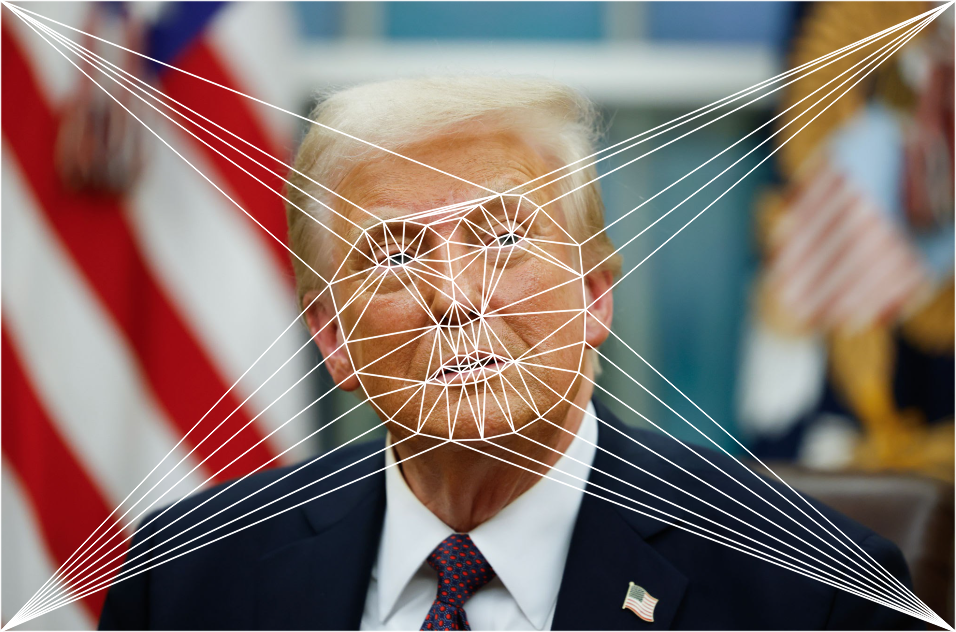

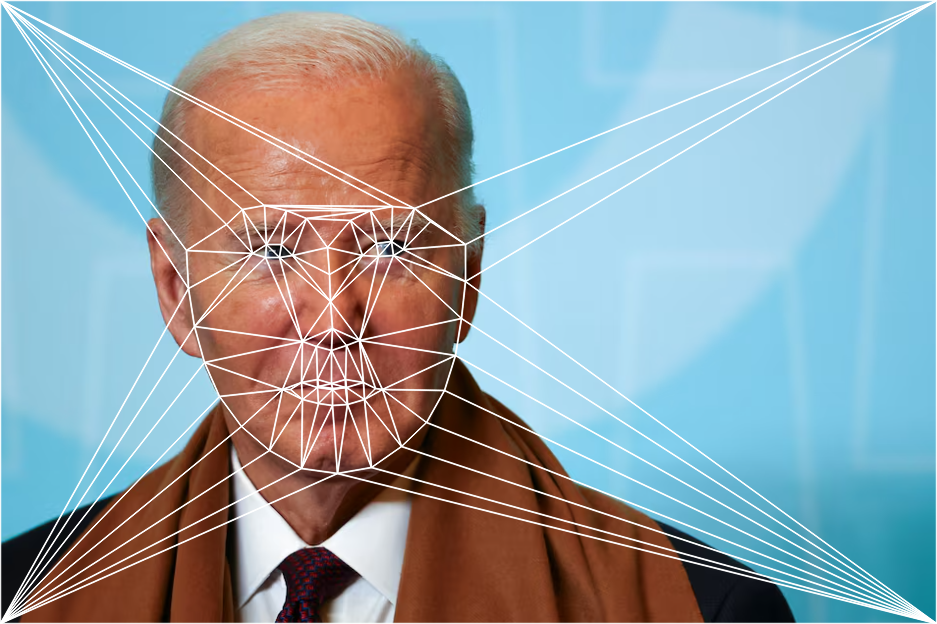

In [31]:
# Check that the input point is inside the boundary rectangle
# by checking each corner
def rect_contains(rect, point):
  if point[0] < rect[0]:
    return False
  elif point[1] < rect[1]:
    return False
  elif point[0] > rect[2]:
    return False
  elif point[1] > rect[3]:
    return False
  return True

def draw_delaunay(img, subdiv, delaunay_color):
  # Get a list of triangles from the Subdiv2D object
  triangleList = subdiv.getTriangleList();

  # Obtain image shape and define rectangle boundaries
  size = img.shape
  r = (0, 0, size[1], size[0])

  # Define image copy, so that not to change the original image
  img_copy = img.copy()

  # Connect point pairs inside triangleList with lines
  for t in triangleList:
    pt1 = (int(t[0]), int(t[1]))
    pt2 = (int(t[2]), int(t[3]))
    pt3 = (int(t[4]), int(t[5]))

    if rect_contains(r, pt1) and rect_contains(r, pt2) and rect_contains(r, pt3):
      cv2.line(img_copy, pt1, pt2, delaunay_color, 1, cv2.LINE_AA, 0)
      cv2.line(img_copy, pt2, pt3, delaunay_color, 1, cv2.LINE_AA, 0)
      cv2.line(img_copy, pt3, pt1, delaunay_color, 1, cv2.LINE_AA, 0)
  cv2_imshow(cv2.cvtColor(img_copy, cv2.COLOR_BGR2RGB))

# Generate the list and visualization of triangle indices of each image
triangle_indices1, subdiv1 = delaunay_triangulation(img1, points1)
draw_delaunay(img1, subdiv1, (255, 255, 255))

triangle_indices2, subdiv2 = delaunay_triangulation(img2, points2)
draw_delaunay(img2, subdiv2, (255, 255, 255))

In [32]:
def compute_morphed_triangle(triangle1, triangle2, triangle, alpha):
    # Find the bounding box of the destination triangle
    r = cv2.boundingRect(triangle)
    x, y, w, h = r

    # Normalize destination points relative to patch
    t_offset = triangle - [x, y]

    # Create the mask for the patch
    mask = np.zeros((h, w, 3), dtype=np.uint8)
    cv2.fillConvexPoly(mask, t_offset.astype(np.int32), (255, 255, 255), 16, 0)

    # Calculate affine transforms
    t1_float = np.float32(triangle1)
    t2_float = np.float32(triangle2)
    t_offset_float = np.float32(t_offset)

    M1 = cv2.getAffineTransform(t1_float, t_offset_float)
    M2 = cv2.getAffineTransform(t2_float, t_offset_float)

    # Warp the full source images
    warp_triangle1 = cv2.warpAffine(
        img1, M1, (w, h)
    )

    warp_triangle2 = cv2.warpAffine(
        img2, M2, (w, h)
    )

    # Blend and mask
    morphed_triangle = (1.0 - alpha) * warp_triangle1 + alpha * warp_triangle2
    morphed_triangle = np.uint8(morphed_triangle)

    # Normalize mask to 0-1
    mask_float = mask / 255.0

    # Paste into result and cut out the background
    result[y:y+h, x:x+w] = result[y:y+h, x:x+w] * (1.0 - mask_float)
    # Add the triangle
    result[y:y+h, x:x+w] += (morphed_triangle * mask_float).astype(np.uint8)

    return None, None, None

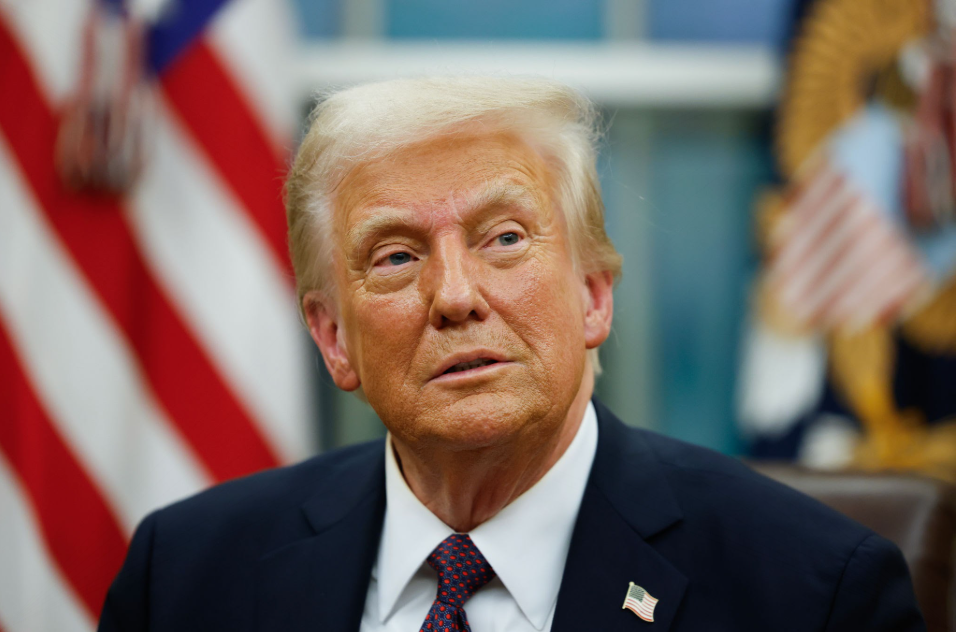

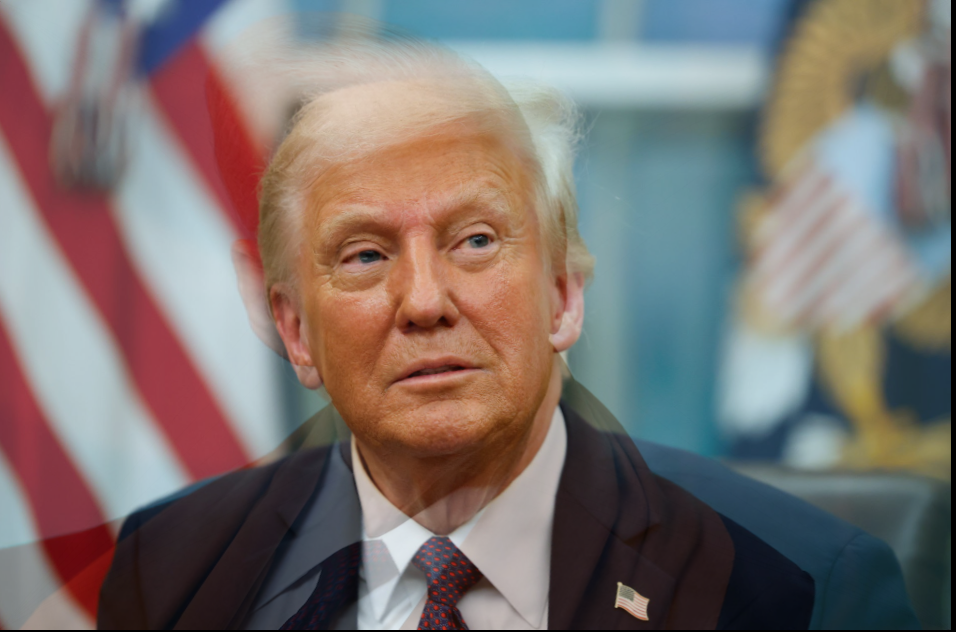

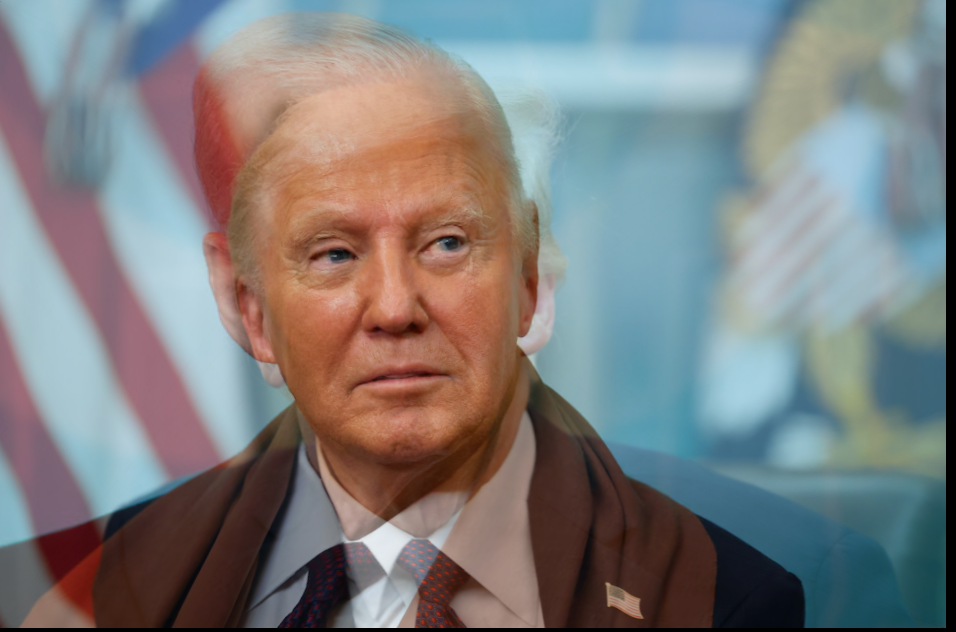

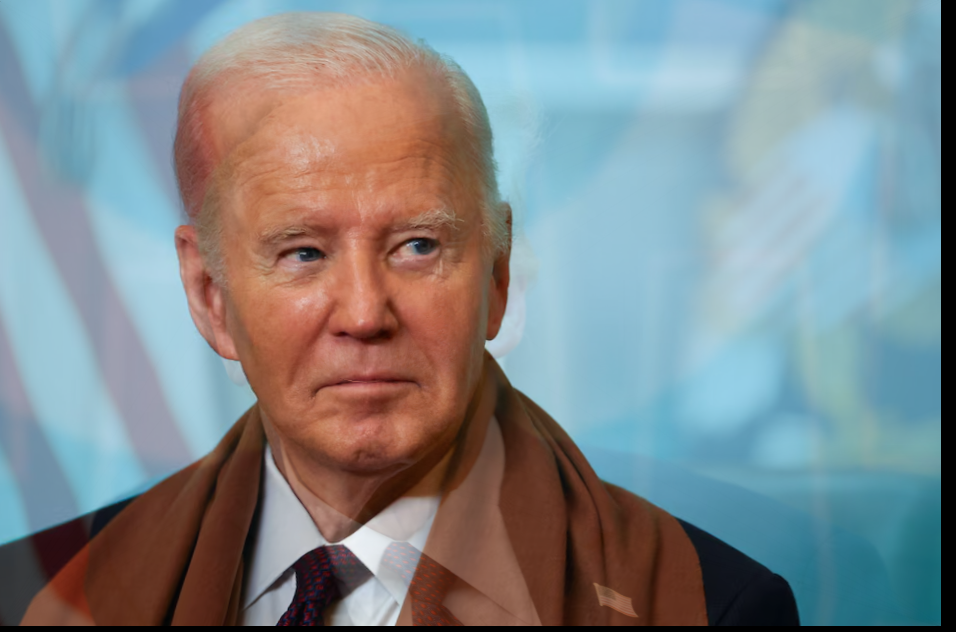

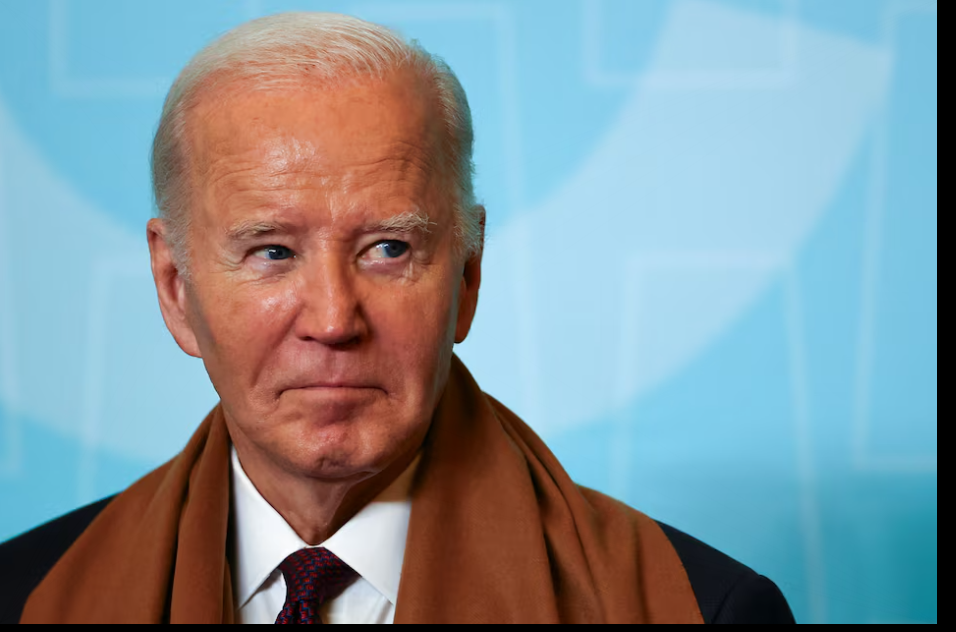

In [33]:
def create_morph(alpha_list):
  global result

  # Create a list of triangle indices
  triangle_indices, subdiv = delaunay_triangulation(img1, points1)

  for alpha in alpha_list:
    # Reset the canvas for each new alpha value
    result = np.zeros_like(img1)

    # Calculate intermediate points using weighted average
    morphed_points = []

    for i in range(len(points1)):
      x = (1 - alpha) * points1[i][0] + alpha * points2[i][0]
      y = (1 - alpha) * points1[i][1] + alpha * points2[i][1]
      morphed_points.append((x, y))

    for idx, t in enumerate(triangle_indices):
      # Get the corresponding triangles in both images and morphed image
      triangle1 = np.array(
          [points1[t[0]], points1[t[1]], points1[t[2]]], dtype=np.float32
      )
      triangle2 = np.array(
          [points2[t[0]], points2[t[1]], points2[t[2]]], dtype=np.float32
      )
      triangle = np.array(
          [morphed_points[t[0]], morphed_points[t[1]], morphed_points[t[2]]], dtype=np.float32
      )

      # Calculate the morphed triangle and add to result
      (cropped_triangle_1, cropped_triangle_2, morphed_triangle) = compute_morphed_triangle(triangle1, triangle2, triangle, alpha)

    cv2_imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))

create_morph(alpha_list=[0.00, 0.25, 0.50, 0.75, 1.00])

In [34]:
def create_morph_gif(filename):
  global result

  # Create a list of triangle indices
  triangle_indices, subdiv = delaunay_triangulation(img1, points1)

  # Initialize empty list to store frames of the gif
  frames = []

  for alpha in np.linspace(0, 1, 100):
    # Calculate intermediate points using weighted average
    morphed_points = []

    for i in range(len(points1)):
      x = (1 - alpha) * points1[i][0] + alpha * points2[i][0]
      y = (1 - alpha) * points1[i][1] + alpha * points2[i][1]
      morphed_points.append((x, y))

    for idx, t in enumerate(triangle_indices):
      # Get the corresponding triangles in both images and morphed image
      triangle1 = np.array(
          [points1[t[0]], points1[t[1]], points1[t[2]]], dtype=np.float32
      )
      triangle2 = np.array(
          [points2[t[0]], points2[t[1]], points2[t[2]]], dtype=np.float32
      )
      triangle = np.array(
          [morphed_points[t[0]], morphed_points[t[1]], morphed_points[t[2]]], dtype=np.float32
      )

      # Calculate the morphed triangle and add to result
      (cropped_triangle_1, cropped_triangle_2, morphed_triangle) = compute_morphed_triangle(triangle1, triangle2, triangle, alpha)

    # Apply median filtering to the result and add it to the frames list
    frames.append(cv.medianBlur(result, 5))

    # Reset result for next iteration
    result = np.zeros_like(img1)

  # Save frames as a gif
  imageio.mimsave(filename, frames, duration=0.04)

In [35]:
# Call create_morph_gif to get output1.gif
create_morph_gif("output1.gif")